# Produit de convolution

Le produit de convolution est particulièrement utile pour intégrer une fonction sur un domaine (souvent temporel) pondérée par une seconde fonction. 
En considérant le système climatique comme un système linéaire, le produit de convolution est utilisé pour obtenir l'évolution d'une variable climatique $X$ en fonction de sa _réponse impulsionnelle_ (IRF$_X$). 

Par exemple:
- l'évolution de la **concentration** de CO$_2$ dans l'atmopshère est donnée par le produit de convolution entre les **émissions** de CO$_2$ et sa **réponse impulsionnelle** (IRF$_{\text{CO}_2}$).
- l'évolution de la température de surface du système ($T_s$) est donnée par le produit de convolution entre les **forçages radiatifs** et la **réponse en température à un forçage impulsionnelle** de 1 W m$^{-2}$ (IRF$_{T_s}$).

Dans ce notebook, on revient sur la définition mathématique et on donne quelques exemples et animations permettant de comprendre son fonctionnement et construction.

## 1. Définition

Le produit de convolution de deux fonctions temporelles $f$ et $g$, est une autre fonction, qui se note généralement $f \ast g$ 
et qui est définie par :

$$ (f \ast g) (t) = \int_{-\infty}^{+\infty} f(t') g(t-t') dt' = \int_{-\infty}^{+\infty} f(t-t') g(t') dt'$$

Dans le cas de deux fonctions définies dans l'espace $[0; +\infty]$, le produit de convolution devient:

$$ (f \ast g) (t) = \int_{0}^{t} f(t') g(t-t') dt' = \int_{0}^{t} f(t-t') g(t') dt'$$

Plusieurs remarques:
- la fonction resultante $f \ast g$ est une fonction du temps $t$, définie dans le même espace que $f$ et $g$
- la valeur pour un instant $t$ donné est l'intégrale du produit de l'instant initial $t_0 = 0$ jusqu'à $t$
- la fonction $f$ est parcourue dans le sens croissant (de $t_0 = 0$ jusqu'à $t$) alors que la fonction $g$ est iversée (de $t$ jusqu'à $t_0 = 0$)


## 2. Exemple - concentration d'un gaz

Dans ce premier exemple, on va appliquer le produit de convolution à un système climatique. 
Posons $f(t) = E_X(t)$ les émissions (en ppm year$^{-1}$) d'une quantité $X$ de gaz dans l'atmosphère et $g(t) = \text{IRF}_X(t)$ la réponse impulsionnelle du système (sans unité) qui décrit comment l'émission instantanée d'une quantité de gaz $X$ décroit dans le temps.

Considérons un cas discret ($\Delta t = 1 $ year), le produit de convolution des deux fonctions, définies de $t_0=0$ à $t_n$, se construit de la manière suivante:
- $(f \ast g)(t_0) = E_X(t_0) \, \text{IRF}(t_0) \, \Delta t$
- $(f \ast g)(t_1) = \left[ E_X(t_0)\,\text{IRF}(t_1) + E_X(t_1)\,\text{IRF}(t_0) \right] \, \Delta t$
- $(f \ast g)(t_2) = \left[ E_X(t_0)\,\text{IRF}(t_2) + E_X(t_1)\,\text{IRF}(t_1) + E_X(t_2)\,\text{IRF}(t_0)\right] \, \Delta t$
- $(f \ast g)(t_3) = \left[ E_X(t_0)\,\text{IRF}(t_3) + E_X(t_1)\,\text{IRF}(t_2) + E_X(t_2)\,\text{IRF}(t_1) + E_X(t_3)\,\text{IRF}(t_0)\right] \, \Delta t$

On voit bien dans cette suite, qu'à chaque nouveau temps $t_n$, l'émission annuelle correspondante $E_X(t_n)$ est ajoutée et pondérée par l'IRF à l'instant initial $t_0$ (notons que l'IRF y est généralement maximale). En revanche, les émissions précédentes $E_X(t_{n-1})$, $E_X(t_{n-2})$, etc. sont pondérées par une IRF de plus en plus *"avancée"* dans le temps, prenant ainsi en compte le fait que l'émission se soit passée il y a plus longtemps.
Avec cette définition, on comprend bien que la fonction $(f \ast g)$ représente bien l'évolution au cours du temps de la concentration du gaz $X$ dans l'atmosphère, soit $\Delta [X]$(t) définie par :

$$ \Delta [X](t_n) = \sum_{i=0}^n E_X(t_i)\,\text{IRF}_X(t_{n-i})\,\Delta t 
   \quad\quad \text{pour }\Delta t \rightarrow 0: \quad
   \Delta [X](t) = \int_0^t E_X(t')\,\text{IRF}_X(t-t')\,dt'$$ 

En python, la définition discrète se calcule de la manière suivante:
```python
import numpy as np 

# let's suppose emissions and IRF are already defined as one-dimensional numpy array (the dimension being the time)
convolv = np.zeros(np.shape(emissions)) 

# loop over all times and compute the convolution at each time step
dt = 1
for t in range(len(emissions)):
    # emissions are taken from 0 to t with [:t+1]; IRF is taken from t to 0 with [t::-1]
    convolv[t] = np.sum(emissions[:t+1] * IRF[t::-1] * dt) 
```

Illustrons maintenant cet exemple en prenant une IRF définie comme une exponentielle décroissante avec un seul temps caractéristique (on reste dans le cas discret où les valeurs sont données pour chaque année):

In [1]:
import matplotlib.animation as anm
import matplotlib.pyplot    as plt
import numpy                as np

%matplotlib inline

def IRF_X(t):
    return np.exp(-t/25)

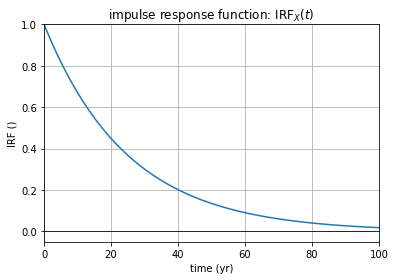

In [2]:
# plot the IRF
plt.figure(figsize=(6,4))

t = np.arange(101)

plt.plot(t, np.zeros_like(t), c='k', lw=0.8)
plt.plot(t, IRF_X(t))
plt.xlim(0, 100)
plt.ylim(None, 1)
plt.ylabel('IRF ()')
plt.xlabel('time (yr)')
plt.title(r'impulse response function: IRF$_X(t)$')
plt.grid(True)

On va maintenant regarder ce que donne le produit de convolution en fonction de différents scénarios d'émission:
- emissions impulsionnelles
- emissions constantes
- emissions croissantes

### 2.1 Emissions impulsionelles

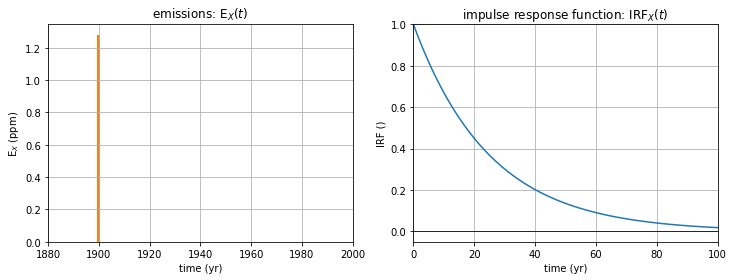

In [3]:
# Emission de 10 GtCO2 sur la première année du scénario
emissions    = np.zeros(101)
emissions[0] = 10 / 7.81

# suppose the scenario start in 1900
t            = np.arange(len(emissions)) + 1900 

# Plot the emissions and IRF
fig, axes = plt.subplots(1, 2, figsize=(12,4))

axes[0].set_title(r'emissions: E$_X(t)$')
axes[0].bar(t, emissions, width=1.2, color='tab:orange')
axes[0].set_xlim(1880, 2000)
axes[0].set_xlabel('time (yr)')
axes[0].set_ylabel(r'E$_X$ (ppm)')
axes[0].grid(True)

axes[1].set_title(r'impulse response function: IRF$_X(t)$')
axes[1].plot(t-1900, np.zeros_like(t), c='k', lw=0.8)
axes[1].plot(t-1900, IRF_X(t-1900), c='tab:blue')
axes[1].set_xlim(0, 100)
axes[1].set_ylim(None, 1)
axes[1].set_xlabel('time (yr)')
axes[1].set_ylabel('IRF ()')
axes[1].grid(True)

In [4]:
# Animation of the concentration
fig, axes = plt.subplots(1, 2, figsize=(12,4))

axes[0].set_title(r'Convolution between emissions and IRF')
axes[0].bar(t, emissions, width=2.5, color='tab:orange')
axes[0].set_xlim(1750, 2050)
axes[0].set_xlabel('time (yr)')
axes[0].grid(True)

axes[1].set_title(r'Evolution of the concentration of $X$: $\Delta [X](t)$')
axes[1].set_xlim(1750, 2050)
axes[1].set_ylim(None, 1.3)
axes[1].set_xlabel('time (yr)')
axes[1].set_ylabel(r'$\Delta [X]$ (ppm)')
axes[1].grid(True)

l, = axes[0].plot(t-150,    IRF_X(t[::-1]-1900), c='tab:blue')
c, = axes[1].plot(t[0]-150, 0                  , c='k'       )

# compute convolution results
E_X       = np.zeros(301)
C_X       = np.zeros(np.shape(E_X)) 

E_X[50:50+len(emissions)] = emissions

dt = 1
for tp in range(len(E_X)):
    C_X[tp] = np.sum(E_X[:tp+1] * IRF_X(np.arange(len(E_X))[tp::-1]) * dt)

# Create animation
def animate(i):
    l.set_data(t-150+2*i, 10 / 7.81 * IRF_X(t[::-1]-1900))
    c.set_data(np.arange(len(E_X))[:2*i]+1850, C_X[:2*i])

ani = anm.FuncAnimation(fig, animate, frames=100)

from IPython.display import HTML
plt.close()
HTML(ani.to_jshtml())

Dans cet exemple, le résultat du produit de convolution redonne l'IRF modulée par l'amplitude de l'émission impulsionnelle (ici 10 GtCO2 ou 1.28 ppm)
Repronons une simulation similaire en ajoutant une seconde emissions après 50 ans (donc en 1950).

In [5]:
# Emission de 10 GtCO2 sur la première et 50e année du scénario
emissions     = np.zeros(101)
emissions[0]  = 10 / 7.81
emissions[49] = 10 / 7.81

# Animation of the concentration
fig, axes = plt.subplots(1, 2, figsize=(12,4))

axes[0].set_title(r'Convolution between emissions and IRF')
axes[0].bar(t, emissions, width=2.5, color='tab:orange')
axes[0].set_xlim(1750, 2050)
axes[0].set_xlabel('time (yr)')
axes[0].grid(True)

axes[1].set_title(r'Evolution of the concentration of $X$: $\Delta [X](t)$')
axes[1].set_xlim(1750, 2050)
axes[1].set_ylim(None, 1.5)
axes[1].set_xlabel('time (yr)')
axes[1].set_ylabel(r'$\Delta [X]$ (ppm)')
axes[1].grid(True)

l, = axes[0].plot(t-150,    IRF_X(t[::-1]-1900), c='tab:blue')
c, = axes[1].plot(t[0]-150, 0                  , c='k'       )

# compute convolution results
E_X       = np.zeros(301)
C_X       = np.zeros(np.shape(E_X)) 

E_X[50:50+len(emissions)] = emissions

dt = 1
for tp in range(len(E_X)):
    C_X[tp] = np.sum(E_X[:tp+1] * IRF_X(np.arange(len(E_X))[tp::-1]) * dt)

# Create animation
def animate(i):
    l.set_data(t-150+2*i, 10 / 7.81 * IRF_X(t[::-1]-1900))
    c.set_data(np.arange(len(E_X))[:2*i]+1850, C_X[:2*i])

ani = anm.FuncAnimation(fig, animate, frames=100)

from IPython.display import HTML
plt.close()
HTML(ani.to_jshtml())

On observe que la concentration est plus forte après le deuxième pic d'émission que le premier car une fraction (~14% soit 0.2ppm) 
est toujours présente en 1950. Néanmoins, la concentration décroit plus fortement également. Il faut en effet 50 ans pour passer de 
1.25 à 0.2 ppm en 1900 alors qu'on passe de 1.5 à 0.2 ppm en 50 ans également après 1950. Cela s'explique du fait que la première émission continue de décroitre en suivant l'IRF après 50 ans.

Considérons désormais des emissions constantes au cours de la simulation:

In [6]:
# Emission de 10 GtCO2 pendant 100 ans
emissions     = np.zeros(101) + 10 / 7.81

# Animation of the concentration
fig, axes = plt.subplots(1, 2, figsize=(12,4))

axes[0].set_title(r'Convolution between emissions and IRF')
axes[0].plot([t[0]-1] + list(t) + [t[-1]+1], [0] + list(emissions) + [0], color='tab:orange')
axes[0].set_xlim(1750, 2050)
axes[0].set_xlabel('time (yr)')
axes[0].grid(True)

axes[1].set_title(r'Evolution of the concentration of $X$: $\Delta [X](t)$')
axes[1].set_xlim(1750, 2050)
axes[1].set_ylim(None, 40)
axes[1].set_xlabel('time (yr)')
axes[1].set_ylabel(r'$\Delta [X]$ (ppm)')
axes[1].grid(True)

l, = axes[0].plot(t-150,    IRF_X(t[::-1]-1900), c='tab:blue')
c, = axes[1].plot(t[0]-150, 0                  , c='k'       )

# compute convolution results
E_X       = np.zeros(301)
C_X       = np.zeros(np.shape(E_X)) 

E_X[50:50+len(emissions)] = emissions

dt = 1
for tp in range(len(E_X)):
    C_X[tp] = np.sum(E_X[:tp+1] * IRF_X(np.arange(len(E_X))[tp::-1]) * dt)

# Create animation
def animate(i):
    l.set_data(t-150+2*i, 10 / 7.81 * IRF_X(t[::-1]-1900))
    c.set_data(np.arange(len(E_X))[:2*i]+1850, C_X[:2*i])

ani = anm.FuncAnimation(fig, animate, frames=100)

from IPython.display import HTML
plt.close()
HTML(ani.to_jshtml())

En dernier exemple, considérons des émissions croissantes (d'abord linéairement puis exponentiellement)

In [7]:
# Emission de 0.1 à 10 Gt.CO2 par an pendant 100 ans
emissions     = np.arange(101) * 0.1 / 7.81

# Animation of the concentration
fig, axes = plt.subplots(1, 2, figsize=(12,4))

axes[0].set_title(r'Convolution between emissions and IRF')
axes[0].plot([t[0]-1] + list(t) + [t[-1]+1], [0] + list(emissions) + [0], color='tab:orange')
axes[0].set_xlim(1750, 2050)
axes[0].set_xlabel('time (yr)')
axes[0].grid(True)

axes[1].set_title(r'Evolution of the concentration of $X$: $\Delta [X](t)$')
axes[1].set_xlim(1750, 2050)
axes[1].set_ylim(None, 30)
axes[1].set_xlabel('time (yr)')
axes[1].set_ylabel(r'$\Delta [X]$ (ppm)')
axes[1].grid(True)

l, = axes[0].plot(t-150,    IRF_X(t[::-1]-1900), c='tab:blue')
c, = axes[1].plot(t[0]-150, 0                  , c='k'       )

# compute convolution results
E_X       = np.zeros(301)
C_X       = np.zeros(np.shape(E_X)) 

E_X[50:50+len(emissions)] = emissions

dt = 1
for tp in range(len(E_X)):
    C_X[tp] = np.sum(E_X[:tp+1] * IRF_X(np.arange(len(E_X))[tp::-1]) * dt)

# Create animation
def animate(i):
    l.set_data(t-150+2*i, 10 / 7.81 * IRF_X(t[::-1]-1900))
    c.set_data(np.arange(len(E_X))[:2*i]+1850, C_X[:2*i])

ani = anm.FuncAnimation(fig, animate, frames=100)

from IPython.display import HTML
plt.close()
HTML(ani.to_jshtml())

In [8]:
# Emissions croissantes exponentiellement
emissions     = 0.001*np.exp(np.arange(101)/10)

# Animation of the concentration
fig, axes = plt.subplots(1, 2, figsize=(12,4))

axes[0].set_title(r'Convolution between emissions and IRF')
axes[0].plot([t[0]-1] + list(t) + [t[-1]+1], [0] + list(emissions) + [0], color='tab:orange')
axes[0].set_xlim(1750, 2050)
axes[0].set_xlabel('time (yr)')
axes[0].grid(True)

axes[1].set_title(r'Evolution of the concentration of $X$: $\Delta [X](t)$')
axes[1].set_xlim(1750, 2050)
axes[1].set_ylim(None, 170)
axes[1].set_xlabel('time (yr)')
axes[1].set_ylabel(r'$\Delta [X]$ (ppm)')
axes[1].grid(True)

l, = axes[0].plot(t-150,    IRF_X(t[::-1]-1900), c='tab:blue')
c, = axes[1].plot(t[0]-150, 0                  , c='k'       )

# compute convolution results
E_X       = np.zeros(301)
C_X       = np.zeros(np.shape(E_X)) 

E_X[50:50+len(emissions)] = emissions

dt = 1
for tp in range(len(E_X)):
    C_X[tp] = np.sum(E_X[:tp+1] * IRF_X(np.arange(len(E_X))[tp::-1]) * dt)

# Create animation
def animate(i):
    l.set_data(t-150+2*i, 10 * IRF_X(t[::-1]-1900))
    c.set_data(np.arange(len(E_X))[:2*i]+1850, C_X[:2*i])

ani = anm.FuncAnimation(fig, animate, frames=100)

from IPython.display import HTML
plt.close()
HTML(ani.to_jshtml())